# Time Series Prediction Using LSTM


In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.filterwarnings("ignore")
print("initial setup complete")

initial setup complete


In [4]:
data_train = pd.read_csv("C:\\Users\\DELL\\Downloads\\Electricity-Demand-Time-Series-Prediction-master\\Electricity-Demand-Time-Series-Prediction-master\\train.csv")
data_meta = pd.read_csv("C:\\Users\\DELL\\Downloads\\Electricity-Demand-Time-Series-Prediction-master\\Electricity-Demand-Time-Series-Prediction-master\\building_metadata.csv")

In [5]:
mer_data = pd.merge(data_train, data_meta, on = 'building_id')
mer_data.timestamp = pd.to_datetime(mer_data['timestamp'])

In [6]:
mer_data = mer_data.set_index("timestamp")

In [7]:
mer_data.head()

,building_id,meter,meter_reading,site_id,primary_use,square_feet,year_built,floor_count
timestamp,,,,,,,,
2016-01-01 00:00:00,0,0,0.0,0,Education,7432,2008.0,NaN
2016-01-01 01:00:00,0,0,0.0,0,Education,7432,2008.0,NaN
2016-01-01 02:00:00,0,0,0.0,0,Education,7432,2008.0,NaN
2016-01-01 03:00:00,0,0,0.0,0,Education,7432,2008.0,NaN
2016-01-01 04:00:00,0,0,0.0,0,Education,7432,2008.0,NaN


# EDA

#### site ID and meter reading 

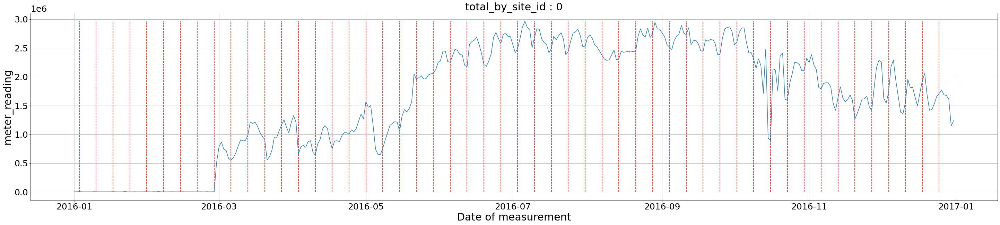

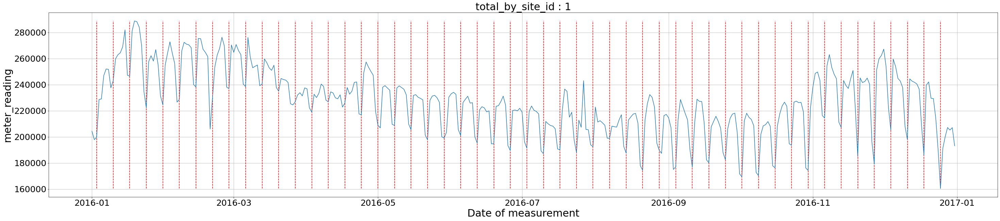

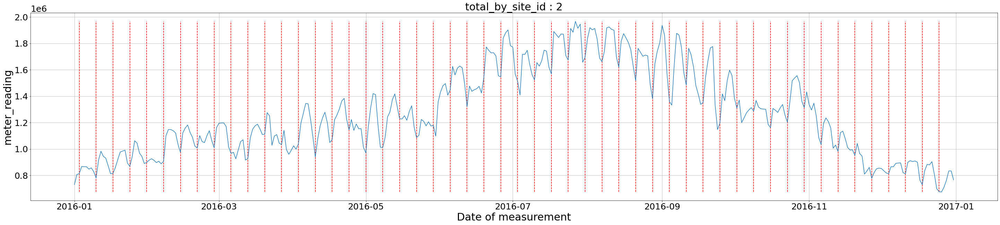

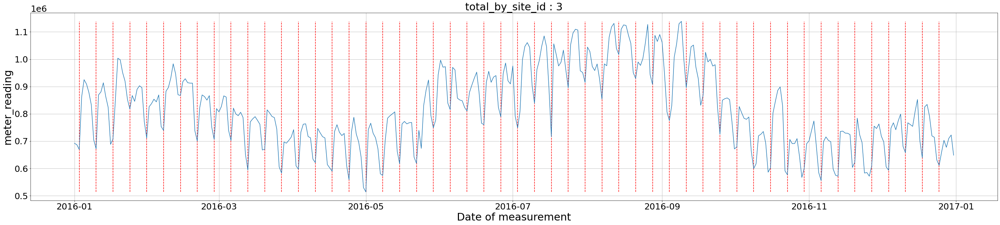

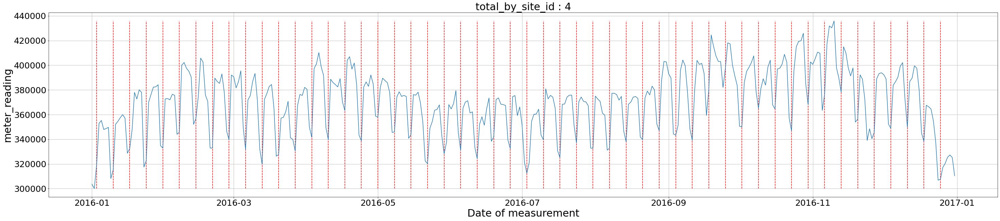

...

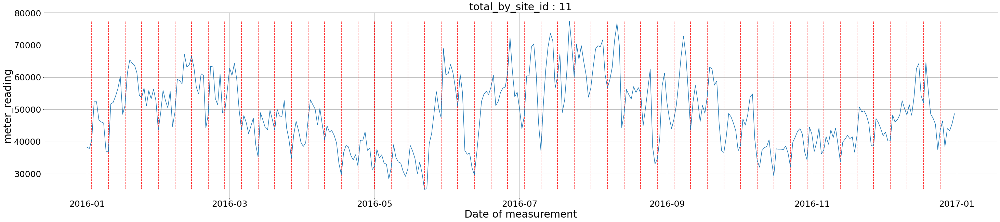

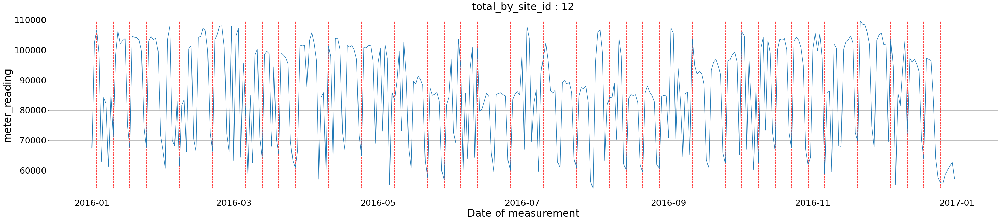

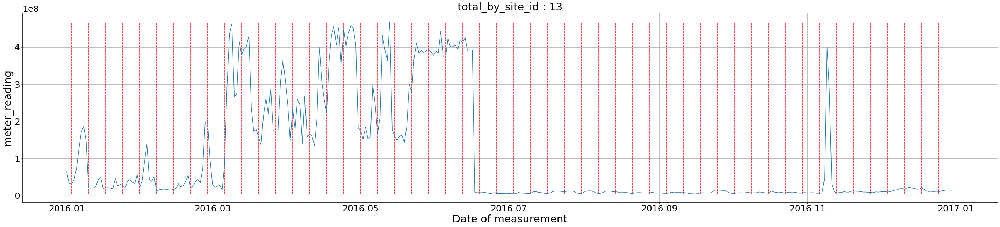

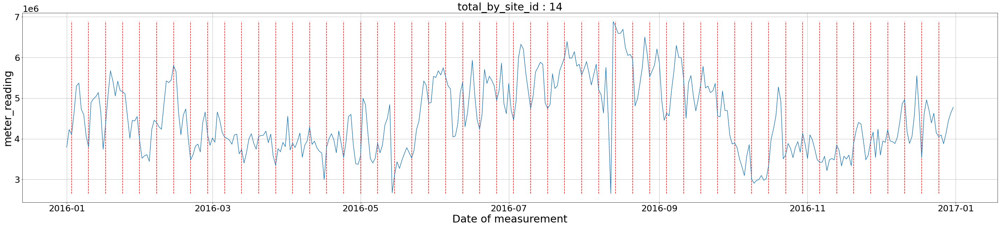

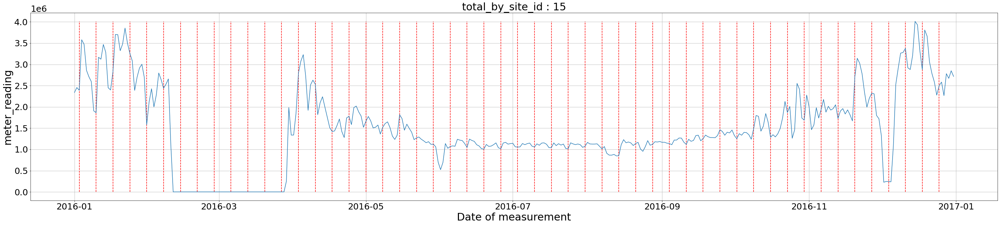

In [6]:
for j in range(16):
        fig = plt.figure(figsize=(50,10))
        plt.rc('xtick',labelsize=25)
        plt.rc('ytick',labelsize=25)
        plt.title('total_by_site_id : ' + str(j),fontsize=30)
        tmp = mer_data[(mer_data['site_id']==j)].resample("D").sum()
        plt.grid(True)
        plt.plot(tmp['meter_reading'])
        plt.vlines(pd.Series(pd.date_range(start='2016-01-01', end='2016-12-31', freq='W')), ymin=np.min(tmp['meter_reading']),ymax=np.max(tmp['meter_reading']), alpha = 1, colors = 'red', linestyles = 'dashed')
        plt.xlabel("Date of measurement",fontsize=30)
        plt.ylabel("meter_reading",fontsize=30)
        plt.show()

#### primary use and meter reading 

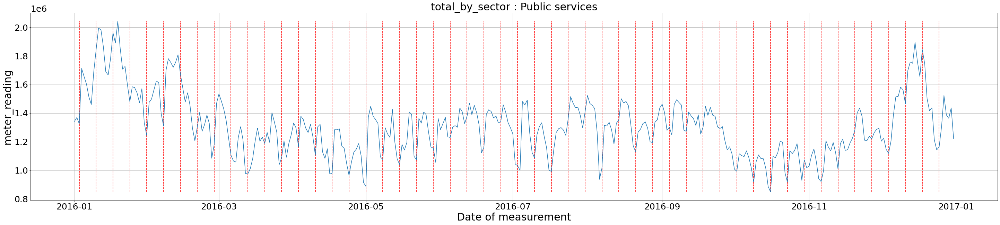

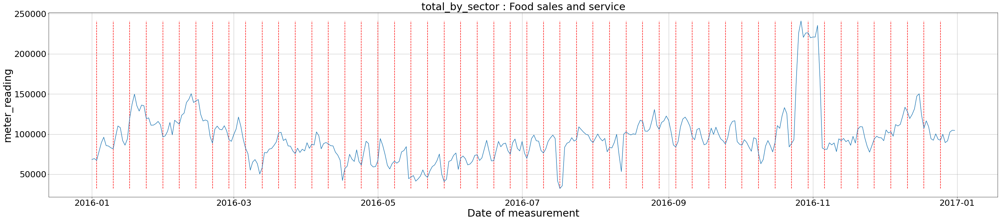

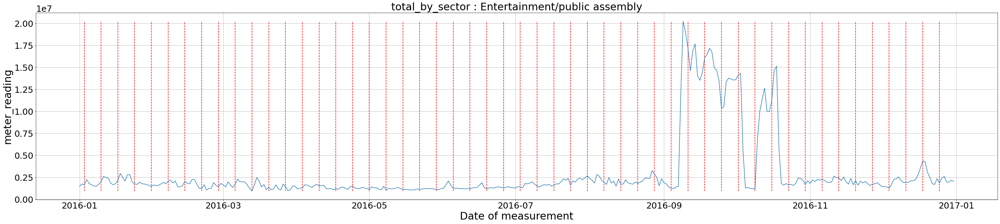

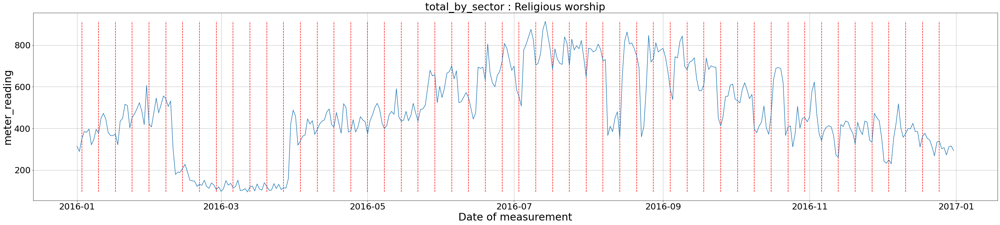

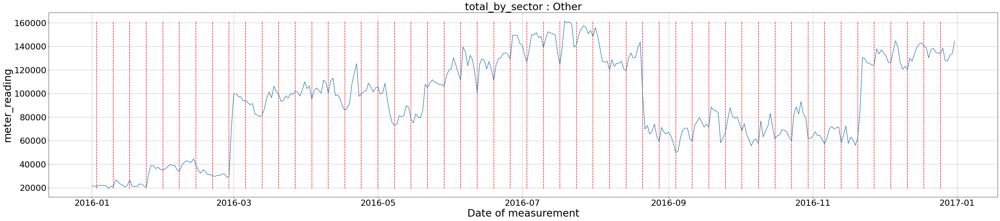

...

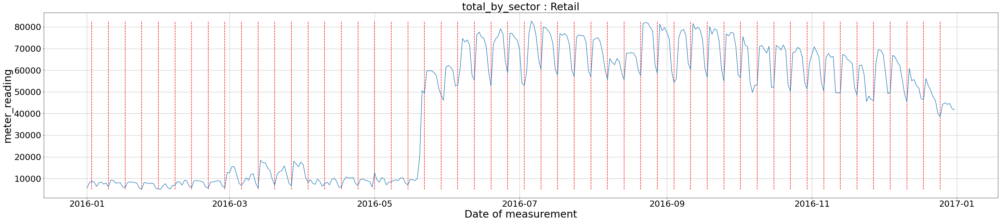

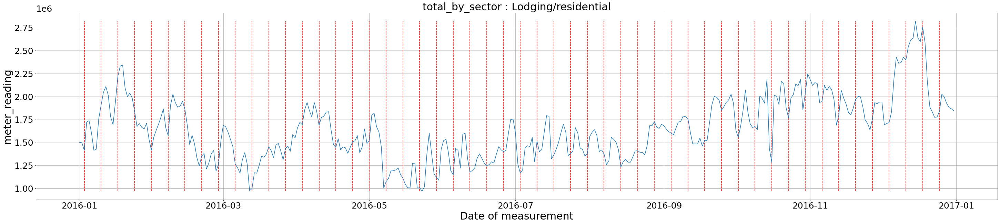

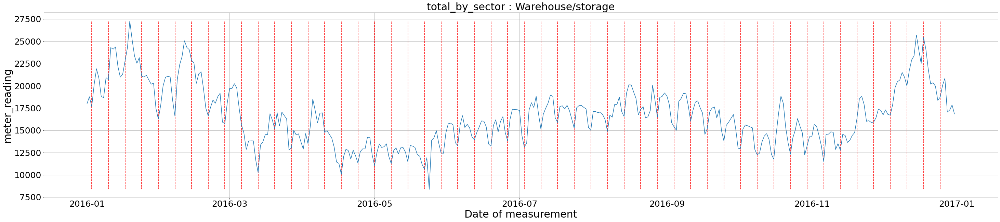

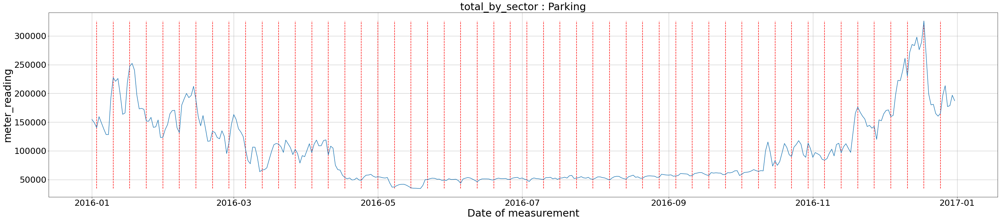

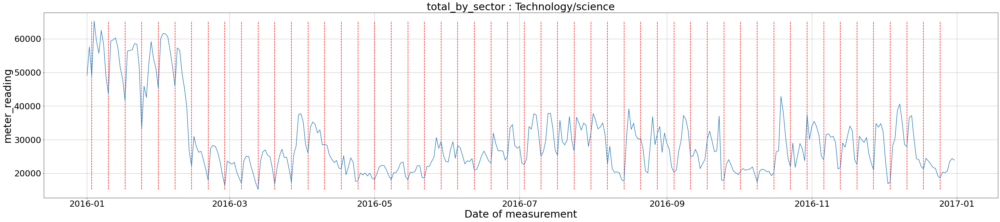

In [7]:
for i in set(mer_data['primary_use']):
    fig = plt.figure(figsize=(50,10))
    plt.rc('xtick',labelsize=25)
    plt.rc('ytick',labelsize=25)
    plt.title('total_by_sector : ' + i,fontsize=30)
    tmp =mer_data[(mer_data['primary_use']==i)].resample("D").sum()
    plt.grid(True)
    plt.plot(tmp['meter_reading']) 
    plt.vlines(pd.Series(pd.date_range(start='2016-01-01', end='2016-12-31', freq='W')), ymin=np.min(tmp['meter_reading']),ymax=np.max(tmp['meter_reading']), alpha = 1, colors = 'red', linestyles = 'dashed') 
    plt.xlabel("Date of measurement",fontsize=30)
    plt.ylabel("meter_reading",fontsize=30)
    plt.savefig('Vtotal_'+ str(i).replace('/','_',1))
    plt.show()

#### site ID  with primary use  with meter reading

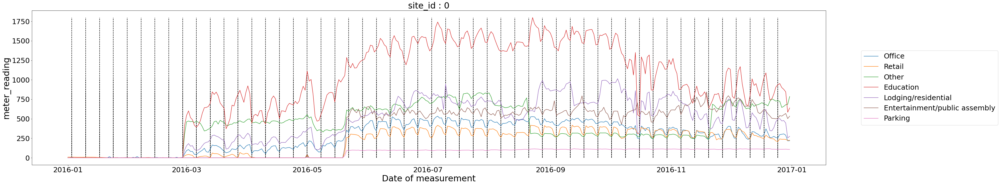

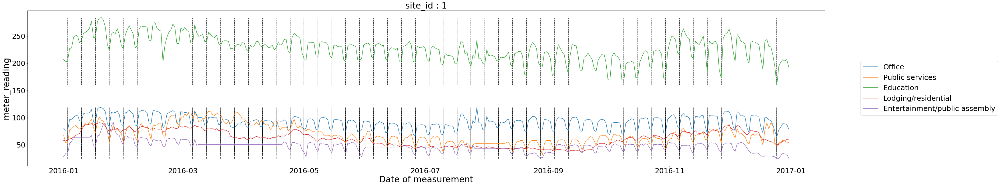

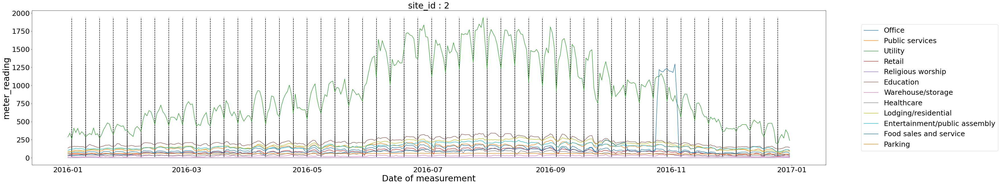

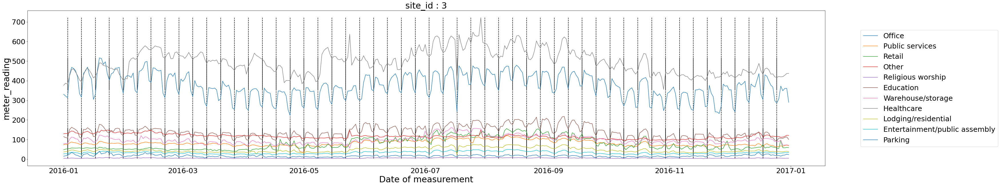

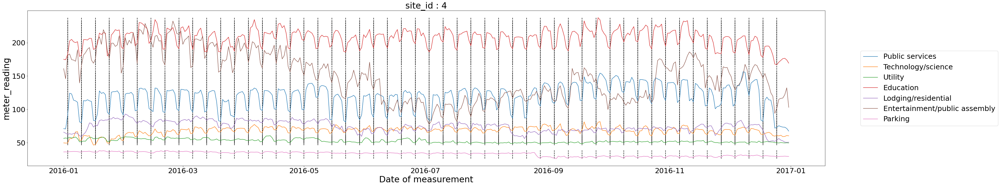

...

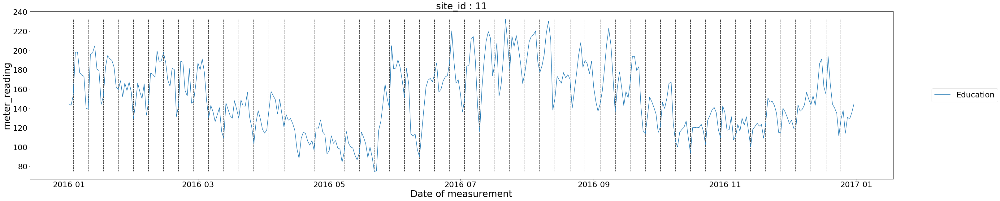

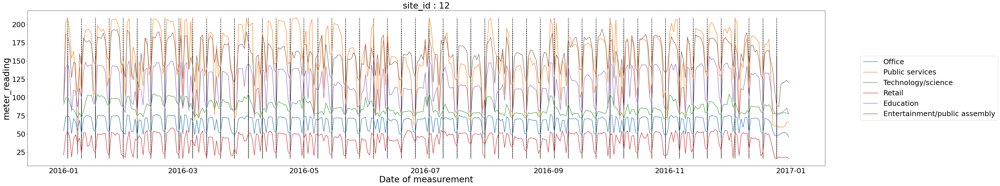

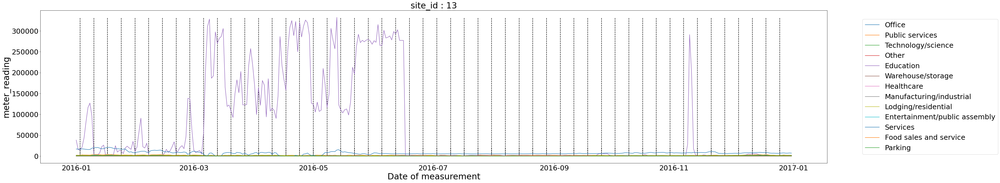

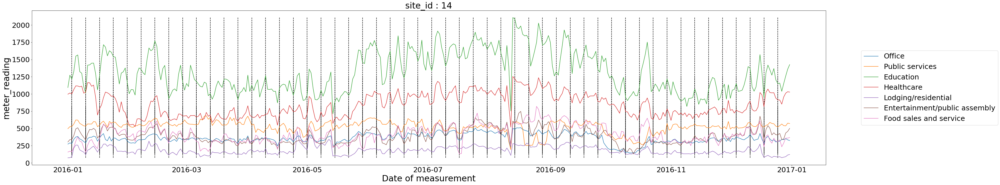

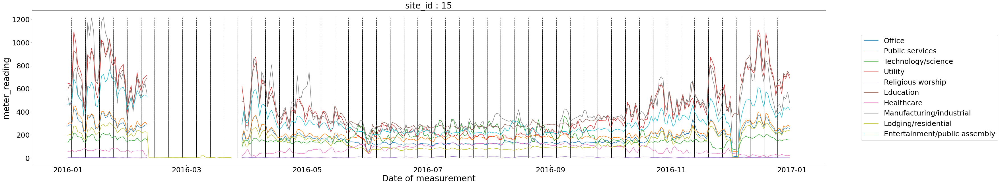

In [9]:
for j in range(16):
    fig = plt.figure(figsize=(50,10))
    for i in set(mer_data[mer_data['site_id']==j]['primary_use']):        
        plt.rc('xtick',labelsize=25)
        plt.rc('ytick',labelsize=25)
        plt.title('site_id : ' + str(j), fontsize=30)
        tmp=mer_data[(mer_data['site_id']==j)&(mer_data['primary_use']==i)].resample("D").mean()
        plt.plot(tmp['meter_reading'])
        plt.vlines(pd.Series(pd.date_range(start='2016-01-01', end='2016-12-31', freq='W')), ymin=np.min(tmp['meter_reading']),ymax=np.max(tmp['meter_reading']), alpha = 1, colors = 'black', linestyles = 'dashed') 
        plt.xlabel("Date of measurement", fontsize=30)
        plt.ylabel("meter_reading", fontsize=30)
    plt.legend(set(mer_data[mer_data['site_id']==j]['primary_use']),
          bbox_to_anchor=(1.04,0.5),loc = "center left",fontsize=25)
    plt.show()

##### Duplicate Site_ID and Office building- Analysis

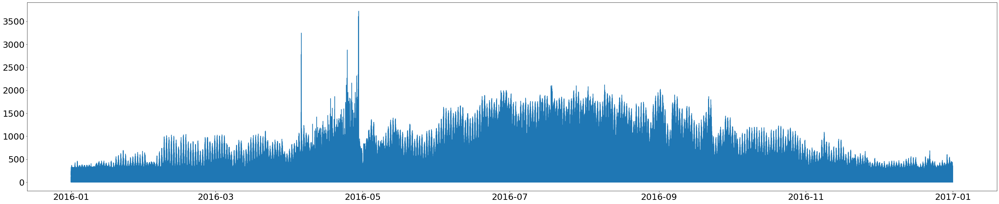

In [10]:
fig = plt.figure(figsize=(50,10))
tmp = mer_data[(mer_data['site_id']==2)&(mer_data['primary_use']=='Office')]
plt.plot(tmp['meter_reading'])

In [11]:
tmp.head()

,building_id,meter,meter_reading,site_id,primary_use,square_feet,year_built,floor_count
timestamp,,,,,,,,
2016-01-01 00:00:00,157,0,28.10,2,Office,5258,NaN,NaN
2016-01-01 01:00:00,157,0,26.57,2,Office,5258,NaN,NaN
2016-01-01 02:00:00,157,0,25.73,2,Office,5258,NaN,NaN
2016-01-01 03:00:00,157,0,25.96,2,Office,5258,NaN,NaN
2016-01-01 04:00:00,157,0,25.59,2,Office,5258,NaN,NaN


- average over time.

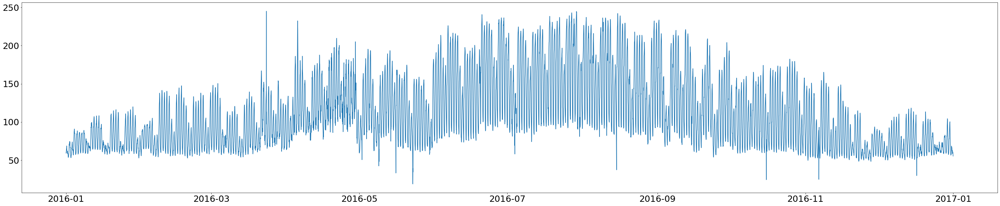

In [12]:
fig = plt.figure(figsize=(50,10))
a=tmp.resample("60T").mean()
plt.plot(a['meter_reading'])

In [14]:
a.to_csv("all.csv")

### Add Features (merge weather data)

In [8]:
train = pd.read_csv("C:\\Users\\DELL\\Downloads\\Electricity-Demand-Time-Series-Prediction-master\\Electricity-Demand-Time-Series-Prediction-master\\all.csv")
w_train = pd.read_csv("C:\\Users\\DELL\\Downloads\\Electricity-Demand-Time-Series-Prediction-master\\Electricity-Demand-Time-Series-Prediction-master\\weather_train.csv")
meta_building = pd.read_csv("C:\\Users\\DELL\\Downloads\\Electricity-Demand-Time-Series-Prediction-master\\Electricity-Demand-Time-Series-Prediction-master\\building_metadata.csv")

In [9]:
train.head()

,timestamp,building_id,meter,meter_reading,site_id,square_feet,year_built,floor_count
0,2016-01-01 00:00:00,230.521739,0.73913,59.416239,2.0,81206.217391,1968.0625,NaN
1,2016-01-01 01:00:00,230.521739,0.73913,59.299878,2.0,81206.217391,1968.0625,NaN
2,2016-01-01 02:00:00,230.521739,0.73913,60.380122,2.0,81206.217391,1968.0625,NaN
3,2016-01-01 03:00:00,230.521739,0.73913,62.482302,2.0,81206.217391,1968.0625,NaN
4,2016-01-01 04:00:00,230.521739,0.73913,64.023207,2.0,81206.217391,1968.0625,NaN


In [10]:
weather = w_train[w_train['site_id'] == 2] #site id == 2 will bring the weather of the current valuation.

In [11]:
weather.isnull().sum() #Checking the value

site_id                  0
timestamp                0
air_temperature          1
cloud_coverage        2354
dew_temperature          1
precip_depth_1_hr       66
sea_level_pressure      44
wind_direction         591
wind_speed               5
dtype: int64

In [12]:
weather.shape

(8783, 9)

In [13]:
#drop column with too many NAs
weather = weather.drop(columns = ['cloud_coverage'])

In [14]:
weather.isnull().sum()

site_id                 0
timestamp               0
air_temperature         1
dew_temperature         1
precip_depth_1_hr      66
sea_level_pressure     44
wind_direction        591
wind_speed              5
dtype: int64

In [15]:
weather = weather.fillna(method = "bfill") #missing values being filled here

In [16]:
weather.head(5)

,site_id,timestamp,air_temperature,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed
17547,2,2016-01-01 00:00:00,15.6,-5.6,0.0,1015.3,270.0,3.6
17548,2,2016-01-01 01:00:00,13.9,-5.6,0.0,1015.6,270.0,4.1
17549,2,2016-01-01 02:00:00,13.3,-5.6,0.0,1016.0,270.0,3.1
17550,2,2016-01-01 03:00:00,12.2,-6.1,0.0,1016.6,280.0,3.1
17551,2,2016-01-01 04:00:00,11.7,-6.7,0.0,1017.0,270.0,3.1


In [17]:
weather = weather.set_index('timestamp')

In [18]:
train = train.set_index('timestamp')

In [19]:
weather.head()

,site_id,air_temperature,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed
timestamp,,,,,,,
2016-01-01 00:00:00,2,15.6,-5.6,0.0,1015.3,270.0,3.6
2016-01-01 01:00:00,2,13.9,-5.6,0.0,1015.6,270.0,4.1
2016-01-01 02:00:00,2,13.3,-5.6,0.0,1016.0,270.0,3.1
2016-01-01 03:00:00,2,12.2,-6.1,0.0,1016.6,280.0,3.1
2016-01-01 04:00:00,2,11.7,-6.7,0.0,1017.0,270.0,3.1


In [20]:
train.head()

,building_id,meter,meter_reading,site_id,square_feet,year_built,floor_count
timestamp,,,,,,,
2016-01-01 00:00:00,230.521739,0.73913,59.416239,2.0,81206.217391,1968.0625,NaN
2016-01-01 01:00:00,230.521739,0.73913,59.299878,2.0,81206.217391,1968.0625,NaN
2016-01-01 02:00:00,230.521739,0.73913,60.380122,2.0,81206.217391,1968.0625,NaN
2016-01-01 03:00:00,230.521739,0.73913,62.482302,2.0,81206.217391,1968.0625,NaN
2016-01-01 04:00:00,230.521739,0.73913,64.023207,2.0,81206.217391,1968.0625,NaN


In [21]:
s=pd.DataFrame(train['meter_reading'])
s.head()

,meter_reading
timestamp,
2016-01-01 00:00:00,59.416239
2016-01-01 01:00:00,59.299878
2016-01-01 02:00:00,60.380122
2016-01-01 03:00:00,62.482302
2016-01-01 04:00:00,64.023207


In [22]:
mer = pd.merge(s, weather, left_index = True, right_index = True ,how = 'left') #meter_Reading, weather merge

In [23]:
mer.head()

,meter_reading,site_id,air_temperature,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed
timestamp,,,,,,,,
2016-01-01 00:00:00,59.416239,2.0,15.6,-5.6,0.0,1015.3,270.0,3.6
2016-01-01 01:00:00,59.299878,2.0,13.9,-5.6,0.0,1015.6,270.0,4.1
2016-01-01 02:00:00,60.380122,2.0,13.3,-5.6,0.0,1016.0,270.0,3.1
2016-01-01 03:00:00,62.482302,2.0,12.2,-6.1,0.0,1016.6,280.0,3.1
2016-01-01 04:00:00,64.023207,2.0,11.7,-6.7,0.0,1017.0,270.0,3.1


In [24]:
mer.to_csv('output.csv')

### Weather EDA
used https://machinelearningmastery.com/multivariate-time-series-forecasting-lstms-keras/

In [25]:
mer=pd.read_csv('output.csv')

In [26]:
dataset=mer.drop(['site_id'], axis=1)

In [27]:
dataset=dataset.set_index('timestamp')

In [28]:
dataset.head()

,meter_reading,air_temperature,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed
timestamp,,,,,,,
2016-01-01 00:00:00,59.416239,15.6,-5.6,0.0,1015.3,270.0,3.6
2016-01-01 01:00:00,59.299878,13.9,-5.6,0.0,1015.6,270.0,4.1
2016-01-01 02:00:00,60.380122,13.3,-5.6,0.0,1016.0,270.0,3.1
2016-01-01 03:00:00,62.482302,12.2,-6.1,0.0,1016.6,280.0,3.1
2016-01-01 04:00:00,64.023207,11.7,-6.7,0.0,1017.0,270.0,3.1


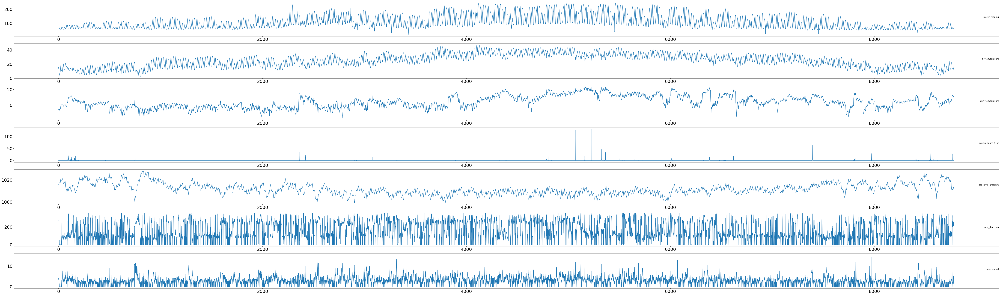

In [47]:
from matplotlib import pyplot
values = dataset.values
# specify columns to plot
groups = [0, 1, 2, 3, 4, 5, 6]
i = 1
# plot each column
pyplot.figure(figsize=(100,30))
for group in groups:
    pyplot.subplot(len(groups), 1, i)
    pyplot.plot(values[:, group])
    pyplot.title(dataset.columns[group], y=0.5, loc='right')
    i += 1
pyplot.show()

# LSTM Modeling

### Data Preprocessing

In [29]:
mer=pd.read_csv('output.csv')

In [30]:
dataset=mer.drop(['site_id'], axis=1)

In [31]:
dataset=dataset.set_index('timestamp')

In [32]:
dataset.head()

,meter_reading,air_temperature,dew_temperature,precip_depth_1_hr,sea_level_pressure,wind_direction,wind_speed
timestamp,,,,,,,
2016-01-01 00:00:00,59.416239,15.6,-5.6,0.0,1015.3,270.0,3.6
2016-01-01 01:00:00,59.299878,13.9,-5.6,0.0,1015.6,270.0,4.1
2016-01-01 02:00:00,60.380122,13.3,-5.6,0.0,1016.0,270.0,3.1
2016-01-01 03:00:00,62.482302,12.2,-6.1,0.0,1016.6,280.0,3.1
2016-01-01 04:00:00,64.023207,11.7,-6.7,0.0,1017.0,270.0,3.1


In [33]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
import keras
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.layers import LSTM
from tensorflow.keras import Sequential
import numpy as np
import math
from sklearn.metrics import mean_squared_error


In [34]:
#time seriesdivided by window size and moved by 1 stride (1,2,3,4,5,6... / 2,3,4,5,6,7... / 3,4,5,6,7,8,...)
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
    n_vars = 1 if type(data) is list else data.shape[1]
    df = pd.DataFrame(data)
    cols, names = list(), list()
    
    # set names of each column
    for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
        names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)] #var1 t-24, var2 t-24,.... var7 t-1
        
        
    # sequences to predict (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
        if i == 0:
            names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
        else:
            names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
    
    # put lists of list together in one dataframe
    agg = pd.concat(cols, axis=1)
    agg.columns = names
    # drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg

In [35]:
values = dataset.values

values = values.astype('float32')# ensure all data is float

scaler = MinMaxScaler(feature_range=(0, 1)) # normalize each feature
scaled = scaler.fit_transform(values)
scaled

array([[0.17892712, 0.2977778 , 0.28641978, ..., 0.5536308 , 0.75      ,
        0.23376623],
       [0.17841256, 0.26      , 0.28641978, ..., 0.56401443, 0.75      ,
        0.26623377],
       [0.18318957, 0.24666667, 0.28641978, ..., 0.57785416, 0.75      ,
        0.2012987 ],
       ...,
       [0.18327081, 0.32222223, 0.65679014, ..., 0.41176605, 0.6666667 ,
        0.2987013 ],
       [0.1657243 , 0.32222223, 0.671605  , ..., 0.40484238, 0.6944445 ,
        0.23376623],
       [0.1613445 , 0.32222223, 0.671605  , ..., 0.40484238, 0.6944445 ,
        0.16883117]], dtype=float32)

### Hyperparameter Tuning

In [36]:
from keras.losses import mean_squared_error
from keras import backend as K

def root_mean_squared_error(y_true, y_pred):
    return K.sqrt(mean_squared_error(y_true, y_pred)) #rmse

In [37]:
def timeseries_lstm(window_size,num_layer,batch_size,epoch):

    window_size=window_size

    reframed = series_to_supervised(scaled, n_in=window_size, n_out=1) 
    #Extract the window size, and predict only one variable (meter_reading) (var1(t))
    # drop weather columns - 
    reframed.drop(reframed.columns[[-6,-5,-4,-3,-2,-1]], axis=1, inplace=True)

    #split train and test
    values = reframed.values
    n_test_hours = 31*24
    train = values[:-n_test_hours, :]
    test = values[-n_test_hours:, :] # I use the last 31 days as test data

    #split train into train & valid
    n_valid_hours = 60*24 #60 days are also set as validation set.
    train = train[:-n_valid_hours, :]
    valid = train[-n_valid_hours:, :]


    train_X, train_y = train[:, :-1], train[:, -1]
    valid_X, valid_y = valid[:, :-1], valid[:, -1]
    test_X, test_y = test[:, :-1], test[:, -1]

    # reshape input to be 3D [samples, timesteps, features]
    train_X = train_X.reshape((train_X.shape[0], window_size, int(train_X.shape[1]/window_size)))
    valid_X = valid_X.reshape((valid_X.shape[0], window_size, int(valid_X.shape[1]/window_size)))
    test_X = test_X.reshape((test_X.shape[0], window_size, int(test_X.shape[1]/window_size)))

    # design model
    model = Sequential()
    for i in range(num_layer-1):
        model.add(LSTM(50, input_shape=(train_X.shape[1], train_X.shape[2]),return_sequences=True))
    model.add(LSTM(50, input_shape=(train_X.shape[1], train_X.shape[2])))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss=root_mean_squared_error)
    
    #fit model
    history = model.fit(train_X, train_y, epochs=epoch, batch_size=batch_size, 
                        validation_data=(valid_X, valid_y), verbose=0, shuffle=False)
    
    rmse = min(history.history['val_loss'])

    return rmse

In [ ]:
random_state = 42
num_loop = 30
hyperparameters_list = []

for loop in range(num_loop):
    warnings.filterwarnings("ignore")
    
    window_size=np.random.choice(np.arange(24, 24*8, 24))
    num_layer=np.random.randint(1,4)
    batch_size=np.random.randint(32,129)
    epoch=np.random.randint(50,150)
    
    parameters = {'loop':loop,
                'window_size': window_size,
                'num_layer': num_layer,
                'batch_size': batch_size,
                'epoch': epoch}
    
    score = timeseries_lstm(window_size,num_layer,batch_size,epoch)
    
    parameters['score'] = score
    
    print(f"{loop:2} iteration = {parameters['epoch']}, Score = {parameters['score']:.3f}")
    
    hyperparameters_list.append(parameters)
    hyperparameters_data = pd.DataFrame(hyperparameters_list)
    hyperparameters_data = hyperparameters_data.sort_values(by="score")
    
    hyperparameters_data.to_csv("paramsearch.csv")
    
hyperparameters_data.head(10)

 0 iteration = 56, Score = 0.021
 1 iteration = 79, Score = 0.022
 2 iteration = 82, Score = 0.024
 3 iteration = 103, Score = 0.022
 4 iteration = 128, Score = 0.022
 5 iteration = 116, Score = 0.021
 6 iteration = 54, Score = 0.021
 7 iteration = 80, Score = 0.021
 8 iteration = 145, Score = 0.022


- Found best hyperparameters to be : {window_size=24, num_layer=3, epoch=149, batch_size=35}

### Fit model with the best parameter

In [ ]:
window_size=24
num_layer=3
epoch=149
batch_size=35

In [ ]:
window_size=window_size

#window size extract, prediction has 1 varable only- (meter_reading)
reframed = series_to_supervised(scaled, n_in=window_size, n_out=1) 

# drop weather columns 
reframed.drop(reframed.columns[[-6,-5,-4,-3,-2,-1]], axis=1, inplace=True)

#split train and test
values = reframed.values
n_test_hours = 31*24
train = values[:-n_test_hours, :]
test = values[-n_test_hours:, :] #The last 31 days are used as test data.

#split train into train & validation sets

n_valid_hours = 60*24 #60 days are also set as validation set.
train = train[:-n_valid_hours, :]
valid = train[-n_valid_hours:, :]


train_X, train_y = train[:, :-1], train[:, -1]
valid_X, valid_y = valid[:, :-1], valid[:, -1]
test_X, test_y = test[:, :-1], test[:, -1]

# reshape input to be 3D [samples, timesteps, features]
train_X = train_X.reshape((train_X.shape[0], window_size, int(train_X.shape[1]/window_size)))
valid_X = valid_X.reshape((valid_X.shape[0], window_size, int(valid_X.shape[1]/window_size)))
test_X = test_X.reshape((test_X.shape[0], window_size, int(test_X.shape[1]/window_size)))

# design model
model = Sequential()
for i in range(num_layer-1):
    model.add(LSTM(50, input_shape=(train_X.shape[1], train_X.shape[2]),return_sequences=True))
model.add(LSTM(50, input_shape=(train_X.shape[1], train_X.shape[2])))
model.add(Dense(1))
model.compile(optimizer='adam', loss=root_mean_squared_error)
    
#fit model
history = model.fit(train_X, train_y, epochs=epoch, batch_size=batch_size, 
                    validation_data=(valid_X, valid_y), verbose=2, shuffle=False)

In [ ]:
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='valid')
plt.legend()
plt.show()

In [ ]:
import numpy as np
import math
from sklearn.metrics import mean_squared_error

# make a prediction
yhat = model.predict(test_X)
test_X = test_X.reshape((test_X.shape[0], window_size*test_X.shape[2]))
test_X[:,1:]
# invert scaling for forecast
inv_yhat = np.concatenate((yhat, test_X[:, 1:7]), axis=1)
inv_yhat
inv_yhat = scaler.inverse_transform(inv_yhat)
inv_yhat = inv_yhat[:,0]

test_y
# invert scaling for actual
test_y = test_y.reshape((len(test_y), 1))
inv_y = np.concatenate((test_y, test_X[:, 1:7]), axis=1)
inv_y = scaler.inverse_transform(inv_y)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = math.sqrt(mean_squared_error(inv_y, inv_yhat))
print('Test RMSE: %.3f' % rmse)

# Resultant EDA

In [ ]:
r=np.concatenate((yhat, test_X[:, 1:7]), axis=1)
r=scaler.inverse_transform(r)
r=pd.DataFrame(r)

In [ ]:
len(r[0])

In [ ]:
def plot_series(time, series, format="-",start=0,end=None):
    plt.plot(time[start:end],series[start:end],format)
    plt.xlabel("Time")
    plt.ylabel("meter reading")
    plt.grid(True)

In [ ]:
import matplotlib.pyplot as plt
series = inv_y
time_step=[]
for x in range(len(series)):
    time_step.append(x)
time=np.array(time_step)
plt.figure(figsize=(50, 6))
plot_series(time,series)
plot_series(time,r[0])